<div style="width: 100%; clear: both;">
<img src="https://www.publicdomainpictures.net/pictures/100000/velka/tree-1409159715eln.jpg", align="left", width="175", height="175">   
<div style="float: left; width: 100%; font-family: Luminari, fantasy;">
<p style="margin: ; padding-top: 10px; text-align:left;  font-size: 19px; ">Porfolio of Ruben Deulofeu Gomez</p>
    <p style="margin: 0; text-align:left; font-size: 16px;">Data science & Machine Learning </p>
    <p style="margin: 0; text-align:left; padding-bottom: 10px; font-size: 16px;">2021</p>
</div>
</div>


# Satellite Image Classification via Deep Learning Resnet


## 0. Uploading Data

In [ ]:
# Downloading and unzip data (via Google Collab)
!wget http://weegee.vision.ucmerced.edu/datasets/UCMerced_LandUse.zip
!unzip UCMerced_LandUse.zip
print("DONE!")

In [26]:
import tensorflow as tf
import keras
print("GPU available: ", tf.config.list_physical_devices('GPU'))

GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [27]:
from keras.preprocessing.image import ImageDataGenerator  
from keras.layers import (
    GlobalAveragePooling2D, Multiply, Flatten,
     Dense, Dropout, Conv2D, BatchNormalization, MaxPooling2D)
from keras.callbacks import EarlyStopping
from keras import Sequential, Model

In [28]:
%pylab inline
import cv2
import glob
import os
import matplotlib.pylab as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['plt', 'axis']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


## 1. Data's Showcase



Our data are composed by 21 folders of 100 images each (2100 images). The label of the images will be the name of the folder, that represents what every image shows. Images have a size of 255x255.

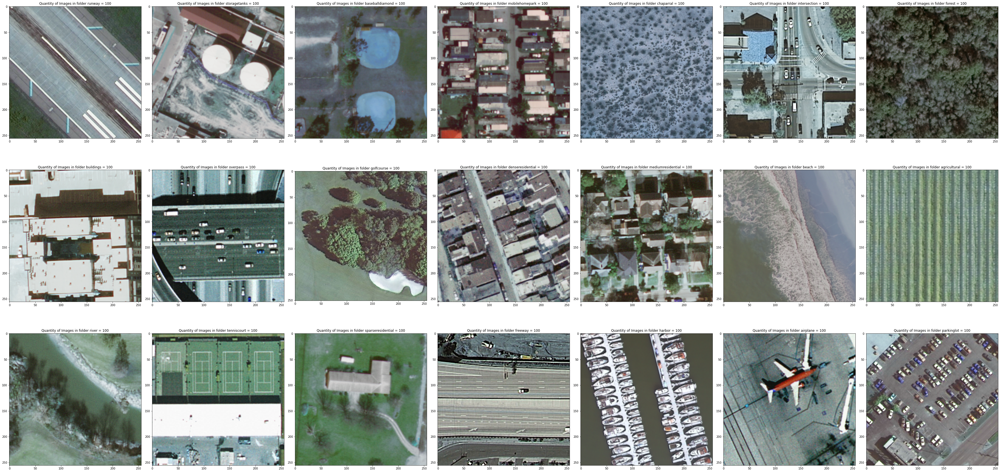

In [29]:
parent_dic = "UCMerced_LandUse/Images/"
fig, axis = plt.subplots(3, 7, figsize=(50, 25))
for root, dirs, files in os.walk(parent_dic):
  for axs, directory in zip(axis.reshape(-1), dirs):
    count = 0
    with os.scandir(os.path.join(parent_dic, directory)) as dir_list:
      for entry in dir_list:
        count = count + 1 

    axs.set_title("Quantity of Images in folder {} = {}".format(directory, count))
    img = cv2.imread(os.path.join(parent_dic,directory, entry.name))
    axs.imshow(img)
plt.tight_layout()

## 2. Deep Convolutional Network (Resnet50)

We will use a pretrained Deep Convolutional Network (Resnet50 and Imagenet weights) with a some variations to make it fit to our problem. 

First of all, we generate the train (with labels) and test set via ImageDataGenerator and flow_from directory function.


In [30]:
datagen = ImageDataGenerator(validation_split=0.33, preprocessing_function=tf.keras.applications.resnet50.preprocess_input)
X_train = datagen.flow_from_directory(parent_dic, subset='training', shuffle=True)
X_val = datagen.flow_from_directory(parent_dic, subset='validation', shuffle=False)

res_format = (224,224)
deep_convo = Sequential()
deep_convo.add(keras.layers.Lambda(lambda image: tf.image.resize(image,res_format)))
deep_convo.add(tf.keras.applications.ResNet50(include_top=False, weights="imagenet"))
deep_convo.add(Flatten())
deep_convo.add(Dense(21, activation='softmax'))

Found 1407 images belonging to 21 classes.
Found 693 images belonging to 21 classes.


#### 2.0.1 Training

In [31]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
deep_convo.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])
callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
deep_convo_training = deep_convo.fit(X_train, epochs=50, callbacks=[callback], validation_data = X_val)

Epoch 1/50
44/44 [==============================] - 48s 861ms/step - loss: 1.2784 - accuracy: 0.6979 - val_loss: 0.6103 - val_accuracy: 0.8240
Epoch 2/50
44/44 [==============================] - 33s 762ms/step - loss: 0.0292 - accuracy: 0.9908 - val_loss: 0.5435 - val_accuracy: 0.8543
Epoch 3/50
44/44 [==============================] - 33s 760ms/step - loss: 0.0119 - accuracy: 0.9964 - val_loss: 0.5488 - val_accuracy: 0.8442
Epoch 4/50
44/44 [==============================] - 33s 761ms/step - loss: 0.0032 - accuracy: 0.9986 - val_loss: 0.5202 - val_accuracy: 0.8600
Epoch 5/50
44/44 [==============================] - 33s 761ms/step - loss: 0.0117 - accuracy: 0.9979 - val_loss: 0.5656 - val_accuracy: 0.8557
Epoch 6/50
44/44 [==============================] - 33s 761ms/step - loss: 0.0035 - accuracy: 0.9993 - val_loss: 0.4919 - val_accuracy: 0.8846
Epoch 7/50
44/44 [==============================] - 33s 761ms/step - loss: 0.0040 - accuracy: 0.9993 - val_loss: 0.4761 - val_accuracy: 0.8817

### 2.1 Model performance

#### 2.1.1 Accuracy and loss

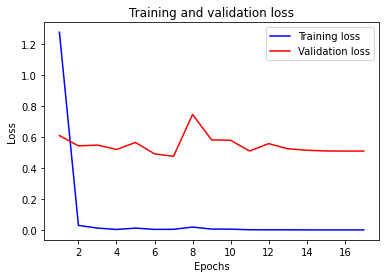

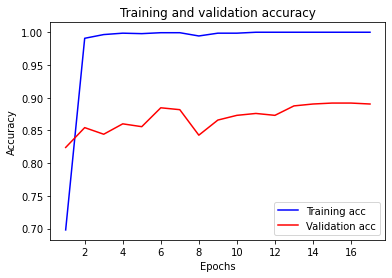

In [32]:
loss = deep_convo_training.history['loss']
val_loss = deep_convo_training.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.clf()
acc = deep_convo_training.history['accuracy']
val_acc = deep_convo_training.history['val_accuracy']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

#### 2.1.2 Stats by Label

In [33]:
y_pred = deep_convo.predict(X_val)
predicted_class = np.argmax(y_pred,axis=1)

print(classification_report(X_val.classes, predicted_class, target_names = X_val.class_indices.keys()))

                   precision    recall  f1-score   support

     agricultural       0.97      0.94      0.95        33
         airplane       0.97      1.00      0.99        33
  baseballdiamond       0.89      0.97      0.93        33
            beach       1.00      0.97      0.98        33
        buildings       0.84      0.79      0.81        33
        chaparral       1.00      1.00      1.00        33
 denseresidential       0.53      0.24      0.33        33
           forest       0.97      0.97      0.97        33
          freeway       0.86      0.97      0.91        33
       golfcourse       0.94      0.88      0.91        33
           harbor       0.87      1.00      0.93        33
     intersection       0.94      0.88      0.91        33
mediumresidential       0.61      0.82      0.70        33
   mobilehomepark       0.70      0.85      0.77        33
         overpass       0.88      0.85      0.86        33
       parkinglot       0.94      1.00      0.97       

#### 2.1.3 Confusion matrix

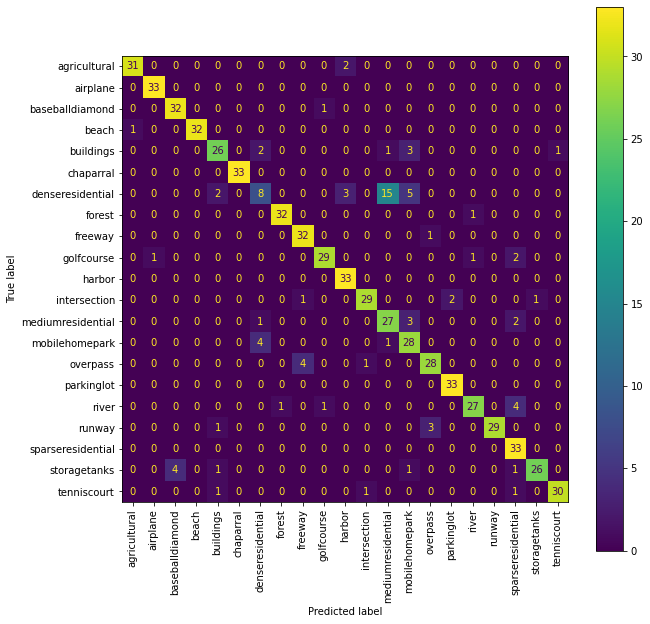

In [34]:
matrix = confusion_matrix(X_val.classes,predicted_class)
disp = ConfusionMatrixDisplay(confusion_matrix=matrix, display_labels=X_val.class_indices.keys())
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(xticks_rotation="vertical",ax=ax)
plt.show()

**As can be seen from the previous information, a precision of 90% is obtained on the test set. Therefore, we can conclude that the DL model performs quite well considering that the number of images is quite small in Deep Learning databases context.** 